In [142]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer

# Carga de informacion

In [89]:
data = pd.read_csv('weatherAUS.csv')
data['RainToday'] = data['RainToday'].replace({'No': 0, 'Yes': 1})
data['RainTomorrow'] = data['RainTomorrow'].replace({'No': 0, 'Yes': 1})

data = data.loc[~data['RainTomorrow'].isna(),:]

data.head(20)

C:\Users\Erick\AppData\Local\Temp\ipykernel_23608\1919518503.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['RainToday'] = data['RainToday'].replace({'No': 0, 'Yes': 1})
C:\Users\Erick\AppData\Local\Temp\ipykernel_23608\1919518503.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['RainTomorrow'] = data['RainTomorrow'].replace({'No': 0, 'Yes': 1})


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0,0.0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0,0.0
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0,0.0
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0.0,0.0
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,0.0,0.0
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,0.0,0.0
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,0.0,0.0
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,0.0,1.0
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,1.0,0.0


# Exploracion

In [90]:
data.shape

(142193, 23)

In [91]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null   fl

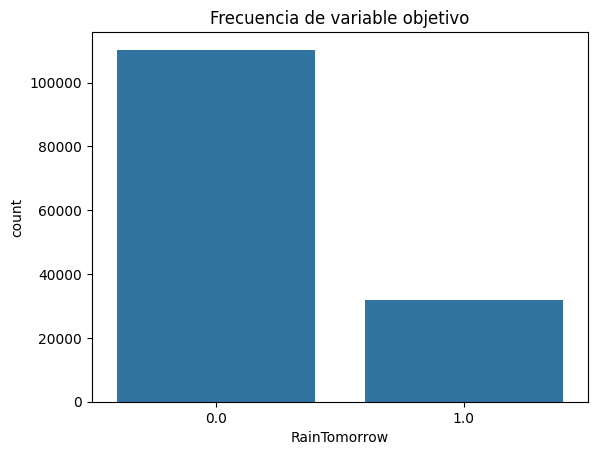

In [92]:
sns.countplot(data=data, x="RainTomorrow")
plt.title("Frecuencia de variable objetivo")
plt.show()

In [93]:
data['RainTomorrow'].value_counts()

RainTomorrow
0.0    110316
1.0     31877
Name: count, dtype: int64

In [94]:
data['RainTomorrow'].value_counts(normalize=True)

RainTomorrow
0.0    0.775819
1.0    0.224181
Name: proportion, dtype: float64

# Nulos

In [95]:
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head(10)

,Total,Percent
Sunshine,67816,0.476929
Evaporation,60843,0.427890
Cloud3pm,57094,0.401525
Cloud9am,53657,0.377353
Pressure9am,14014,0.098556
Pressure3pm,13981,0.098324
WindDir9am,10013,0.070418
WindGustDir,9330,0.065615
WindGustSpeed,9270,0.065193
WindDir3pm,3778,0.026570


In [96]:
data['RainTomorrow'].isna().sum()

np.int64(0)

# Transformaciones

In [104]:
imputador = SimpleImputer(strategy='most_frequent')
data = pd.DataFrame(data=imputador.fit_transform(data), columns=data.columns, index=data.index).convert_dtypes()

data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,W,44,W,...,71,22,1007.7,1007.1,8,7,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44,NNW,...,44,25,1010.6,1007.8,7,7,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46,W,...,38,30,1007.6,1008.7,7,2,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,NE,24,SE,...,45,16,1017.6,1012.8,7,7,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,W,41,ENE,...,82,33,1010.8,1006.0,7,8,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,4.0,0.0,E,31,ESE,...,59,27,1024.7,1021.2,7,7,9.4,20.9,0,0
145455,2017-06-21,Uluru,2.8,23.4,0.0,4.0,0.0,E,31,SE,...,51,24,1024.6,1020.3,7,7,10.1,22.4,0,0
145456,2017-06-22,Uluru,3.6,25.3,0.0,4.0,0.0,NNW,22,SE,...,56,21,1023.5,1019.1,7,7,10.9,24.5,0,0
145457,2017-06-23,Uluru,5.4,26.9,0.0,4.0,0.0,N,37,SE,...,53,24,1021.0,1016.8,7,7,12.5,26.1,0,0


In [105]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  string 
 1   Location       142193 non-null  string 
 2   MinTemp        142193 non-null  Float64
 3   MaxTemp        142193 non-null  Float64
 4   Rainfall       142193 non-null  Float64
 5   Evaporation    142193 non-null  Float64
 6   Sunshine       142193 non-null  Float64
 7   WindGustDir    142193 non-null  string 
 8   WindGustSpeed  142193 non-null  Int64  
 9   WindDir9am     142193 non-null  string 
 10  WindDir3pm     142193 non-null  string 
 11  WindSpeed9am   142193 non-null  Int64  
 12  WindSpeed3pm   142193 non-null  Int64  
 13  Humidity9am    142193 non-null  Int64  
 14  Humidity3pm    142193 non-null  Int64  
 15  Pressure9am    142193 non-null  Float64
 16  Pressure3pm    142193 non-null  Float64
 17  Cloud9am       142193 non-null  In

In [107]:
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,W,44,W,...,71,22,1007.7,1007.1,8,7,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44,NNW,...,44,25,1010.6,1007.8,7,7,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46,W,...,38,30,1007.6,1008.7,7,2,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,NE,24,SE,...,45,16,1017.6,1012.8,7,7,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,W,41,ENE,...,82,33,1010.8,1006.0,7,8,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,4.0,0.0,E,31,ESE,...,59,27,1024.7,1021.2,7,7,9.4,20.9,0,0
145455,2017-06-21,Uluru,2.8,23.4,0.0,4.0,0.0,E,31,SE,...,51,24,1024.6,1020.3,7,7,10.1,22.4,0,0
145456,2017-06-22,Uluru,3.6,25.3,0.0,4.0,0.0,NNW,22,SE,...,56,21,1023.5,1019.1,7,7,10.9,24.5,0,0
145457,2017-06-23,Uluru,5.4,26.9,0.0,4.0,0.0,N,37,SE,...,53,24,1021.0,1016.8,7,7,12.5,26.1,0,0


In [108]:
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head(10)

,Total,Percent
Date,0,0.0
Location,0,0.0
MinTemp,0,0.0
MaxTemp,0,0.0
Rainfall,0,0.0
Evaporation,0,0.0
Sunshine,0,0.0
WindGustDir,0,0.0
WindGustSpeed,0,0.0
WindDir9am,0,0.0


In [130]:
data = pd.get_dummies(data=data, columns=['WindDir3pm', 'WindDir9am', 'WindGustDir'], dtype=int)

# Analizando Correlaciones

In [146]:
corr = data[[col for col in data.columns if col.find('Dir')==-1]].corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool))
cmap = sns.diverging_palette(250, 25, as_cmap=True)

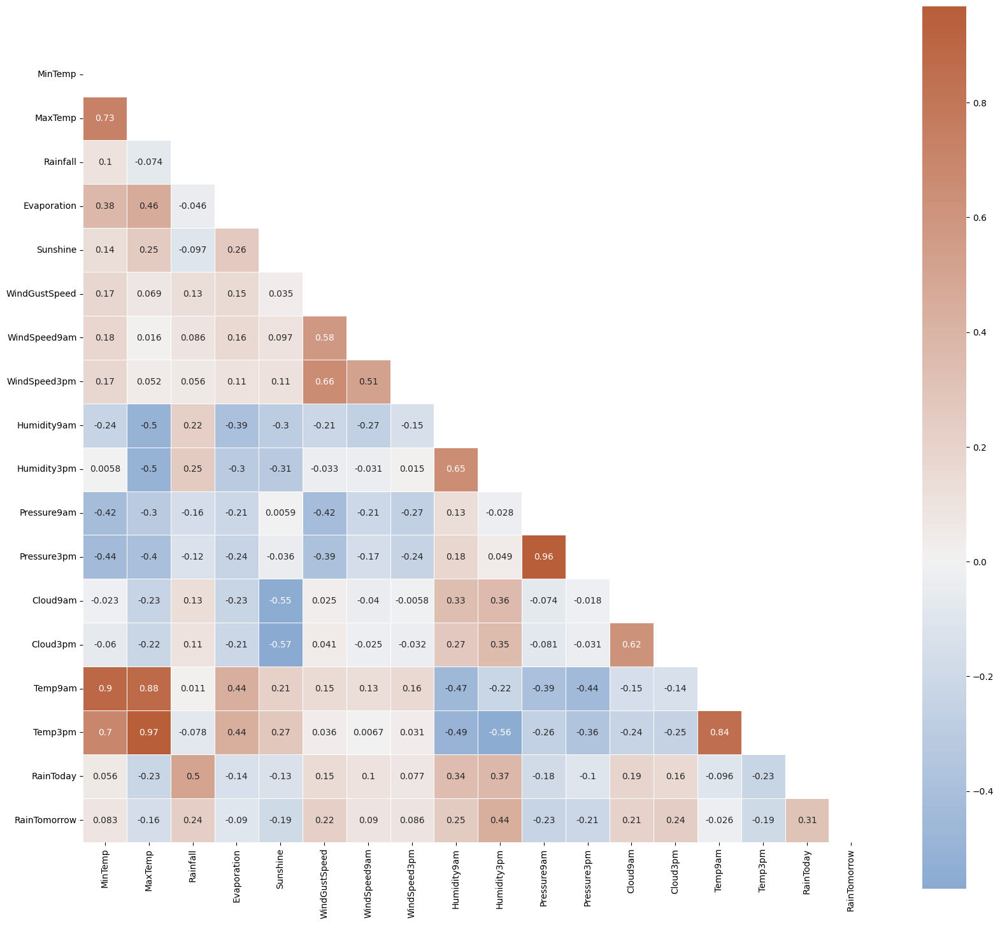

In [148]:
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})
plt.show()

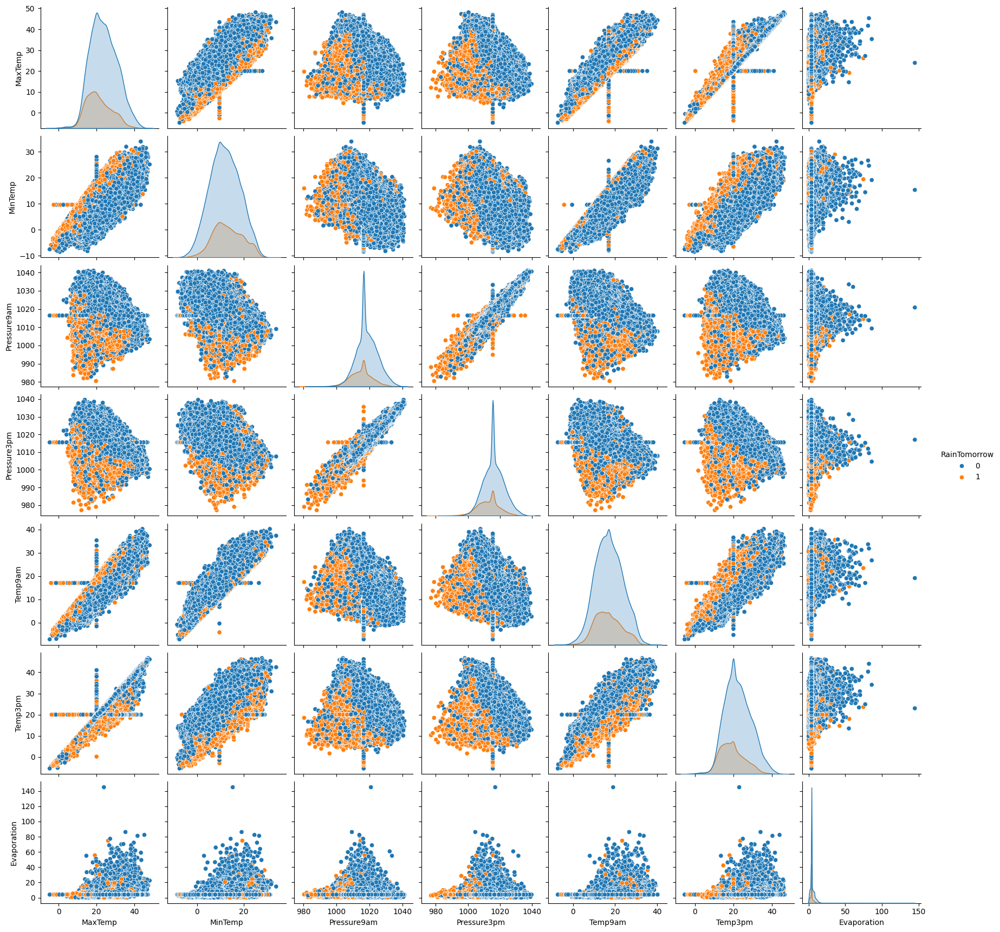

In [118]:
sns.pairplot( data=data, vars=('MaxTemp','MinTemp','Pressure9am','Pressure3pm', 'Temp9am', 'Temp3pm', 'Evaporation'), hue='RainTomorrow' )

In [133]:
def calculate_iv(df, target):
    """
    Calculate Information Value (IV) for all features in the dataset.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame containing features and a binary target variable.
    target (str): Name of the binary target column.
    
    Returns:
    dict: A dictionary with feature names as keys and their respective IV values as values.
    """
    iv_dict = {}
    
    for feature in df.columns:
        if feature == target:
            continue
        
        # Creating bins for numerical variables
        if df[feature].dtype in ['int64', 'float64']:
            df[feature] = pd.qcut(df[feature], q=10, duplicates='drop')
        
        grouped = df.groupby(feature).agg({target: ['sum', 'count']})
        grouped.columns = ['bad', 'total']
        grouped['good'] = grouped['total'] - grouped['bad']
        
        grouped['bad_dist'] = grouped['bad'] / grouped['bad'].sum()
        grouped['good_dist'] = grouped['good'] / grouped['good'].sum()
        grouped['woe'] = np.log(grouped['good_dist'] / grouped['bad_dist']).replace({np.inf: 0, -np.inf: 0})
        grouped['iv'] = (grouped['good_dist'] - grouped['bad_dist']) * grouped['woe']
        
        iv_dict[feature] = grouped['iv'].sum()
    
    return iv_dict

In [149]:
iv_values = pd.Series(calculate_iv(data, 'RainTomorrow'))
iv_values.sort_values(ascending=False).head(60)

Humidity3pm        1.417548
Date               0.699981
Sunshine           0.653656
Cloud3pm           0.625531
Rainfall           0.589243
RainToday          0.471061
Humidity9am        0.468332
Cloud9am           0.429572
Pressure9am        0.346504
Pressure3pm        0.290610
WindGustSpeed      0.285074
Temp3pm            0.258361
MaxTemp            0.178995
Location           0.162107
MinTemp            0.081367
Evaporation        0.078756
WindSpeed3pm       0.059439
WindSpeed9am       0.048939
Temp9am            0.036688
WindDir3pm_E       0.000000
WindDir3pm_ENE     0.000000
WindDir3pm_ESE     0.000000
WindDir3pm_N       0.000000
WindDir3pm_NE      0.000000
WindDir3pm_NNE     0.000000
WindDir3pm_NNW     0.000000
WindDir3pm_NW      0.000000
WindDir3pm_S       0.000000
WindDir3pm_SE      0.000000
WindDir3pm_SSE     0.000000
WindDir3pm_SSW     0.000000
WindDir3pm_SW      0.000000
WindDir3pm_W       0.000000
WindDir3pm_WNW     0.000000
WindDir3pm_WSW     0.000000
WindDir9am_E       0

In [137]:
iv_values.sort_values(ascending=False).head(20).index

Index(['Humidity3pm', 'Date', 'Sunshine', 'Cloud3pm', 'Rainfall', 'RainToday',
       'Humidity9am', 'Cloud9am', 'Pressure9am', 'Pressure3pm',
       'WindGustSpeed', 'Temp3pm', 'MaxTemp', 'Location', 'MinTemp',
       'Evaporation', 'WindSpeed3pm', 'WindSpeed9am', 'Temp9am',
       'WindDir3pm_E'],
      dtype='object')

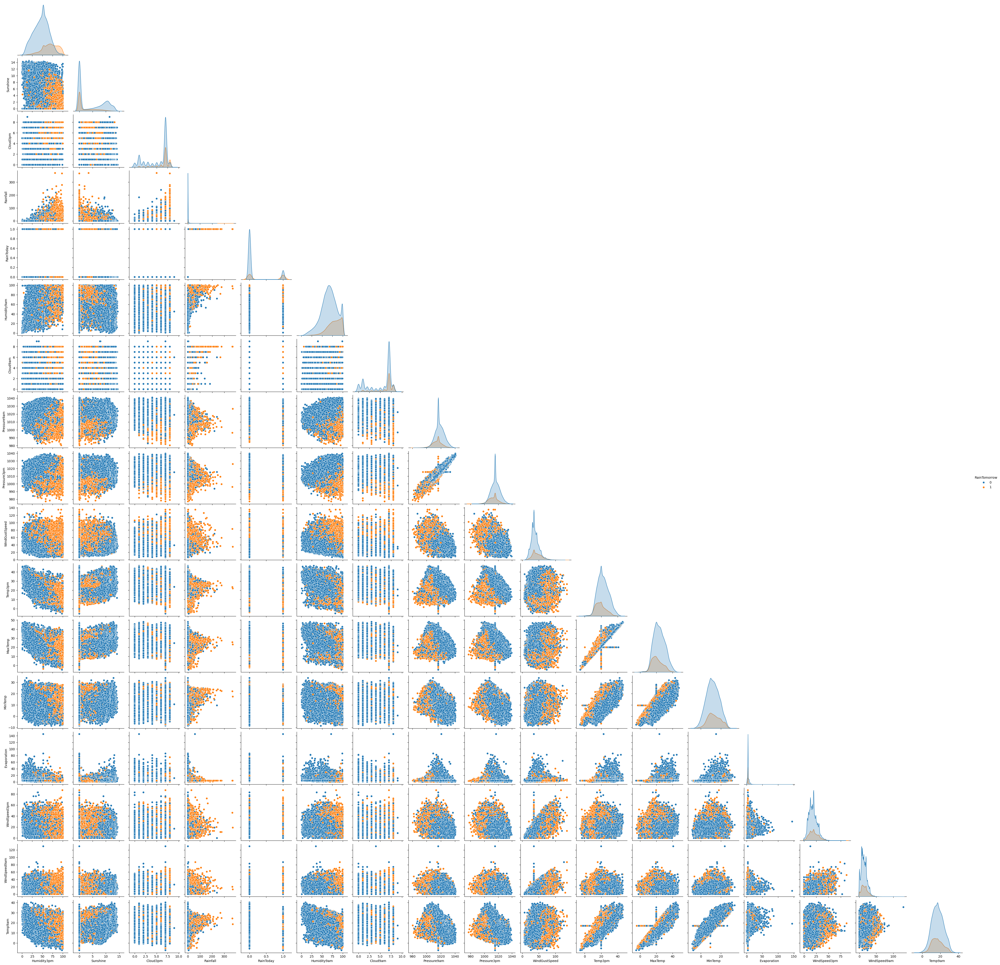

In [139]:
sns.pairplot(
    data=data,
    vars=(
        'Humidity3pm', 'Sunshine', 'Cloud3pm', 'Rainfall', 'RainToday',
        'Humidity9am', 'Cloud9am', 'Pressure9am', 'Pressure3pm',
        'WindGustSpeed', 'Temp3pm', 'MaxTemp', 'MinTemp',
        'Evaporation', 'WindSpeed3pm', 'WindSpeed9am', 'Temp9am'
        ),
    hue='RainTomorrow', corner=True)
plt.show()

# Analizando distribuciones

In [150]:
data.describe(percentiles=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]).round(2)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0,142193.0
mean,12.17,23.22,2.33,4.84,3.99,39.66,13.95,18.53,69.22,51.5,1017.53,1015.28,5.4,5.51,16.99,21.65,0.22,0.22
std,6.39,7.11,8.43,3.25,4.69,13.2,8.86,8.75,19.23,20.53,6.76,6.68,2.59,2.43,6.47,6.87,0.42,0.42
min,-8.5,-4.8,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,980.5,977.1,0.0,0.0,-7.2,-5.4,0.0,0.0
10%,4.0,14.5,0.0,2.0,0.0,24.0,4.0,9.0,44.0,23.0,1009.2,1006.8,1.0,1.0,8.9,13.3,0.0,0.0
20%,6.6,16.9,0.0,3.4,0.0,30.0,7.0,11.0,54.0,33.0,1012.3,1009.8,2.0,3.0,11.3,15.7,0.0,0.0
30%,8.5,18.9,0.0,4.0,0.0,33.0,9.0,13.0,60.0,41.0,1014.6,1012.1,5.0,5.0,13.2,17.6,0.0,0.0
40%,10.2,20.7,0.0,4.0,0.0,35.0,11.0,15.0,65.0,47.0,1016.4,1014.2,7.0,7.0,15.0,19.4,0.0,0.0
50%,12.0,22.6,0.0,4.0,0.2,37.0,13.0,17.0,70.0,52.0,1016.7,1015.5,7.0,7.0,16.8,20.9,0.0,0.0
60%,13.8,24.7,0.0,4.0,4.6,41.0,15.0,20.0,75.0,57.0,1018.6,1016.2,7.0,7.0,18.5,22.9,0.0,0.0


In [151]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,...,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,44,20,24,...,"(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]"
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,44,4,22,...,"(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]"
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,46,19,26,...,"(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]"
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,24,11,9,...,"(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]"
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,41,7,20,...,"(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]","(-0.001, 1.0]"


In [160]:
data['RainTomorrow'] = pd.Categorical(data['RainTomorrow'])

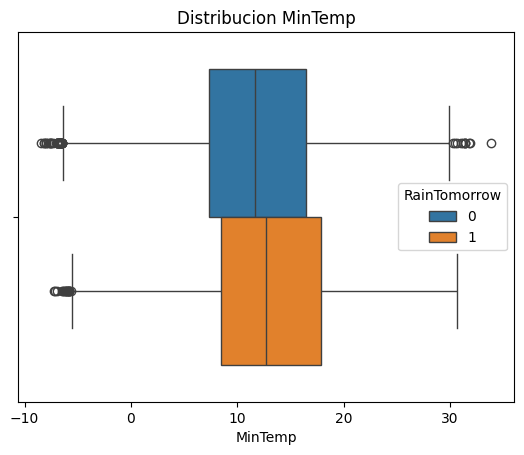

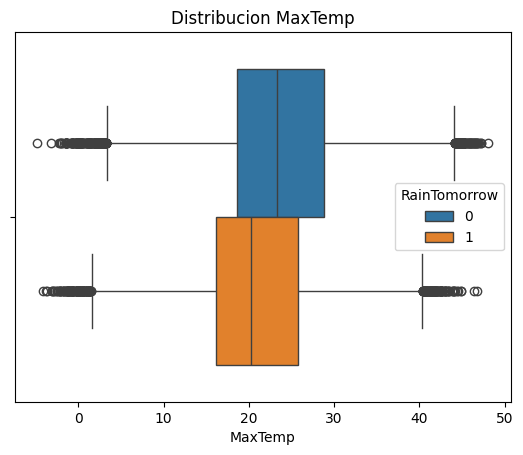

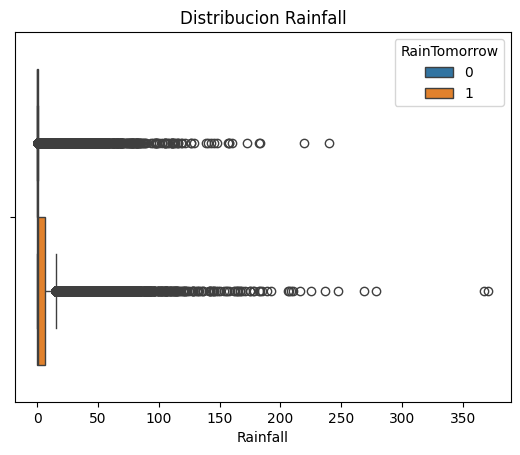

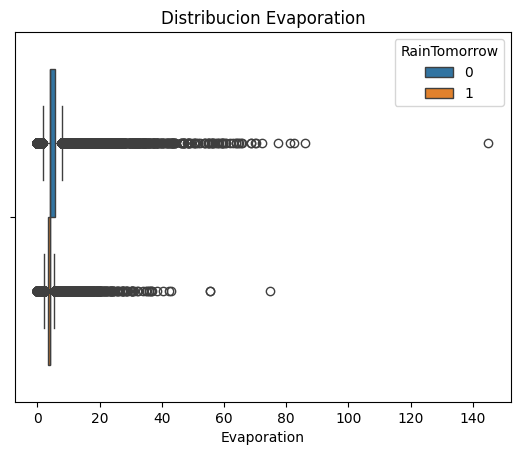

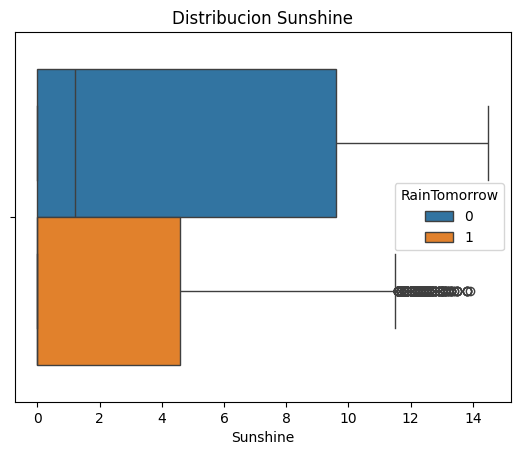

...

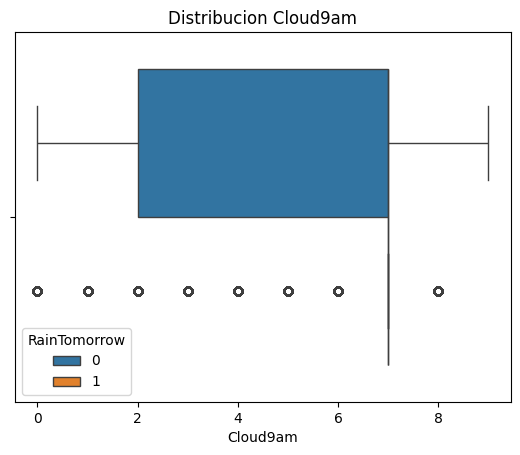

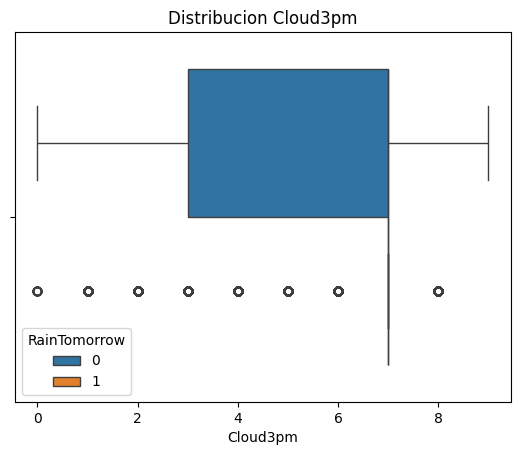

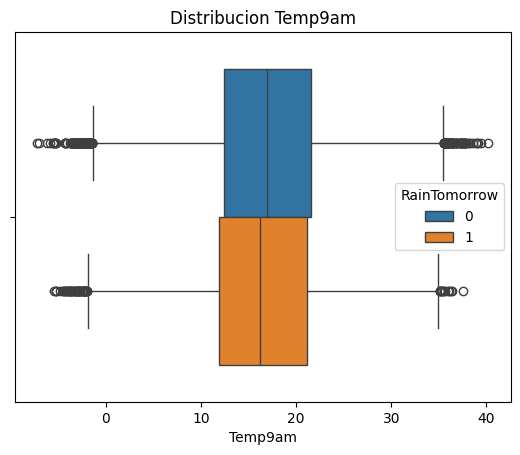

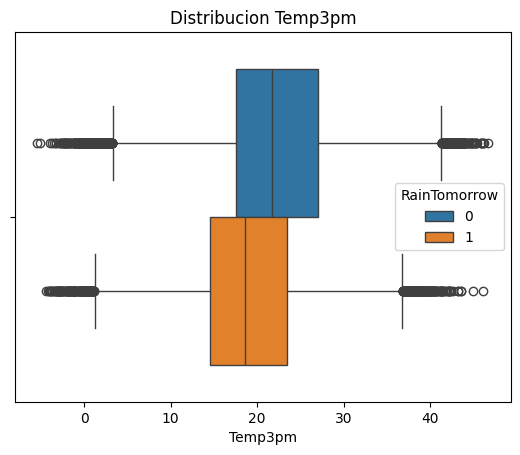

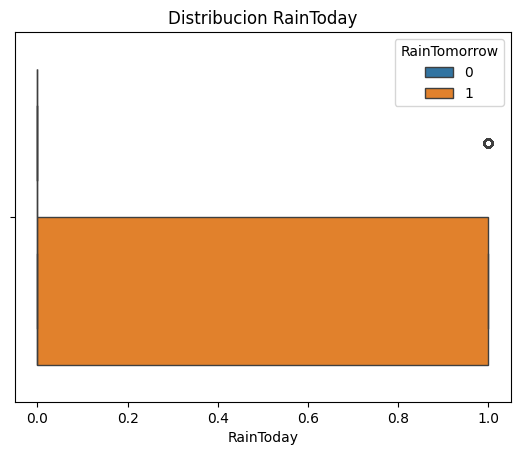

In [165]:
for col in data.columns:
    if data[col].dtype in ["Float64", "Int64"]:
        sns.boxplot(data=data, x=col, hue='RainTomorrow')
        plt.title(f"Distribucion {col}")
        plt.show()

# Modelación

## Librerías

In [168]:
from sklearn.model_selection import train_test_split

## Carga de Datos

In [167]:
data = pd.read_csv('weatherAUS.csv')
data['RainToday'] = data['RainToday'].replace({'No': 0, 'Yes': 1})
data['RainTomorrow'] = data['RainTomorrow'].replace({'No': 0, 'Yes': 1})
data = data.loc[~data['RainTomorrow'].isna(),:]
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0,0.0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0,0.0
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0,0.0
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0.0,0.0
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0


In [171]:
X = data.drop('RainTomorrow', axis=1)[['Humidity3pm', 'Sunshine', 'Cloud3pm', 'Rainfall', 'RainToday',
        'Humidity9am', 'Cloud9am', 'Pressure9am', 'Pressure3pm',
        'WindGustSpeed', 'Temp3pm', 'MaxTemp', 'MinTemp',
        'Evaporation', 'WindSpeed3pm', 'WindSpeed9am', 'Temp9am']]
y = data['RainTomorrow']

# Separando datos

In [172]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


# Tratamiento de nulos

In [177]:
imputador = SimpleImputer(strategy='median')
X_train = pd.DataFrame(data=imputador.fit_transform(X_train), columns=X_train.columns, index=X_train.index).convert_dtypes()
X_test = pd.DataFrame(data=imputador.transform(X_test), columns=X_test.columns, index=X_test.index).convert_dtypes()

assert X_train.isna().sum().sum() + X_test.isna().sum().sum() == 0